In [1]:
import warnings
import os
import sys

import numpy as np
import xarray as xr
import getpass


%matplotlib inline
warnings.simplefilter("ignore")

In [2]:
sys.path.append('..')

In [3]:
from src.mod_io import *
from src.mod_plot import *
from src.mod_eddy import *

### Create an account on Copernicus Marine Service: 
#### https://resources.marine.copernicus.eu/registration-form

### Login

In [4]:
USERNAME = 'mballarotta1'
PASSWORD = getpass.getpass('Enter your password: ')

Enter your password:  ··········


### Select Copernicus Sea level Product

In [5]:
DUACS_L4_DT_DATASET_ID = 'cmems_obs-sl_glo_phy-ssh_my_allsat-l4-duacs-0.25deg_P1D'
GLORYS12v1_DATASET_ID = 'cmems_mod_glo_phy_my_0.083_P1D-m'
OSTIA_DT_DATASET_ID = 'METOFFICE-GLO-SST-L4-REP-OBS-SST'
CHLORO_DATASET_ID = 'dataset-oc-glo-chl-multi_cci-l4-chl_4km_monthly-rep-v02'

In [6]:
date_of_interest = '2019-01-01'

### Read GLORYS12v1 Reanalysis Product

In [7]:
data_store_glorys12v1 = copernicusmarine_datastore(GLORYS12v1_DATASET_ID, USERNAME, PASSWORD)

In [8]:
ds_glorys12v1 = xr.open_dataset(data_store_glorys12v1)
ds_glorys12v1 = ds_glorys12v1.rename({'zos': 'adt'})

### Read OSTIA SST Product

In [9]:
data_store_ostia = copernicusmarine_datastore(OSTIA_DT_DATASET_ID, USERNAME, PASSWORD)

In [10]:
ds_ostia = xr.open_dataset(data_store_ostia)

### Read Chlorophyll Product

In [11]:
data_store_chlorophyll = copernicusmarine_datastore(CHLORO_DATASET_ID, USERNAME, PASSWORD)

In [12]:
ds_chlorophyll = xr.open_dataset(data_store_chlorophyll)

### Read DUACS-DT2021 Product

In [13]:
data_store_duacs_dt2021 = copernicusmarine_datastore(DUACS_L4_DT_DATASET_ID, USERNAME, PASSWORD)

In [14]:
ds_duacs_dt2021 = xr.open_dataset(data_store_duacs_dt2021)

### Select date of interest

In [15]:
ds_glorys12v1_selection = ds_glorys12v1['adt'].sel(time=date_of_interest)
ds_glorys12v1_selection = ds_glorys12v1_selection.to_dataset()

In [16]:
ds_duacs_dt2021_selection = ds_duacs_dt2021['adt'].sel(time=date_of_interest)
ds_duacs_dt2021_selection = ds_duacs_dt2021_selection.to_dataset()

In [17]:
ds_ostia_selection = ds_ostia.sel(time=date_of_interest)
ds_ostia_selection['lon']= ds_ostia_selection['lon']%360.
ds_ostia_selection = ds_ostia_selection.sortby('lon')

In [18]:
ds_chloro_selection = ds_chlorophyll.sel(time=date_of_interest)
ds_chloro_selection['longitude'] = ds_chloro_selection['longitude']%360.
ds_chloro_selection = ds_chloro_selection.sortby('longitude')

### Eddy detection GLORYS12v1

In [19]:
regular_grid_glorys12, anticyclone_glorys12, cyclone_glorys12 = eddy_detection(ds_glorys12v1_selection, pixel_limit=(15, 6000))

We assume pixel position of grid is centered for /home/mballarotta/demo_cmems_diags/notebooks/tmpcruih_a_.nc
No filtering above 85.000000 degrees of latitude


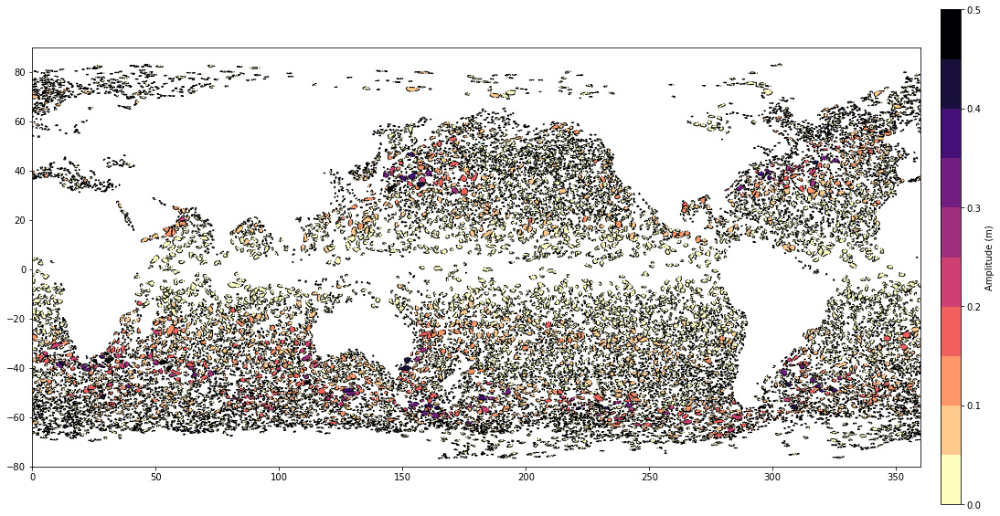

In [20]:
display_identification(anticyclone_glorys12, cyclone_glorys12, lon_min=0, lon_max=360, lat_min=-80, lat_max=90)

### Eddy detection DUACS-DT2021

In [21]:
regular_grid_duacs_dt2021, anticyclone_duacs_dt2021, cyclone_duacs_dt2021 = eddy_detection(ds_duacs_dt2021_selection, pixel_limit=(5, 2000))

We assume pixel position of grid is centered for /home/mballarotta/demo_cmems_diags/notebooks/tmp5z2e93l8.nc
No filtering above 85.000000 degrees of latitude


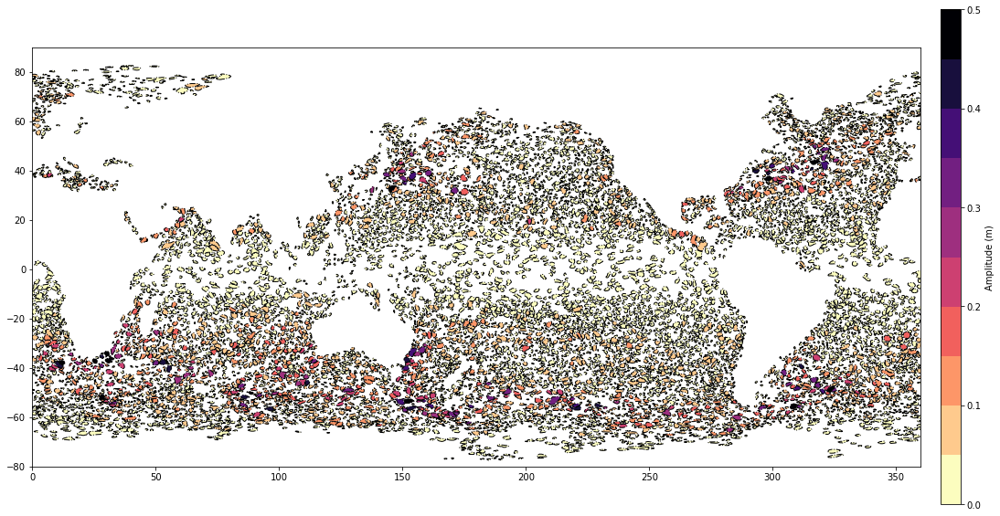

In [22]:
display_identification(anticyclone_duacs_dt2021, cyclone_duacs_dt2021, lon_min=0, lon_max=360, lat_min=-80, lat_max=90)

### Compare Eddy-detection GLORYS12v1 vs DUACS-DT2021

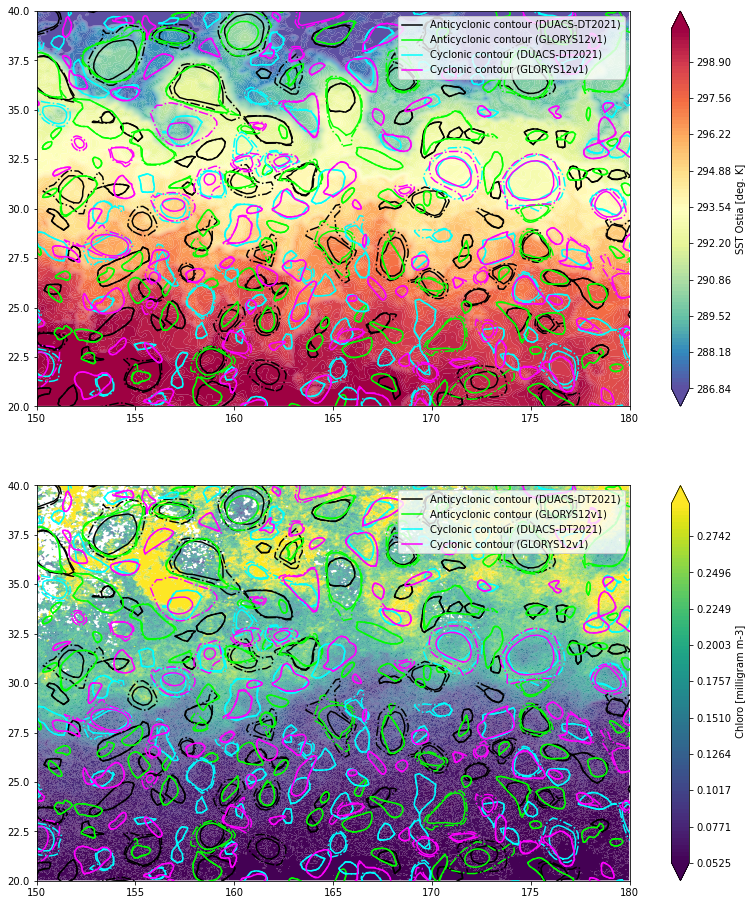

In [23]:
compare_identification(anticyclone_duacs_dt2021, cyclone_duacs_dt2021, 'DUACS-DT2021', 
                       anticyclone_glorys12, cyclone_glorys12, 'GLORYS12v1', 
                       lon_min=150, lon_max=180, lat_min=20, lat_max=40, ds_sst=ds_ostia_selection, ds_chloro=ds_chloro_selection)

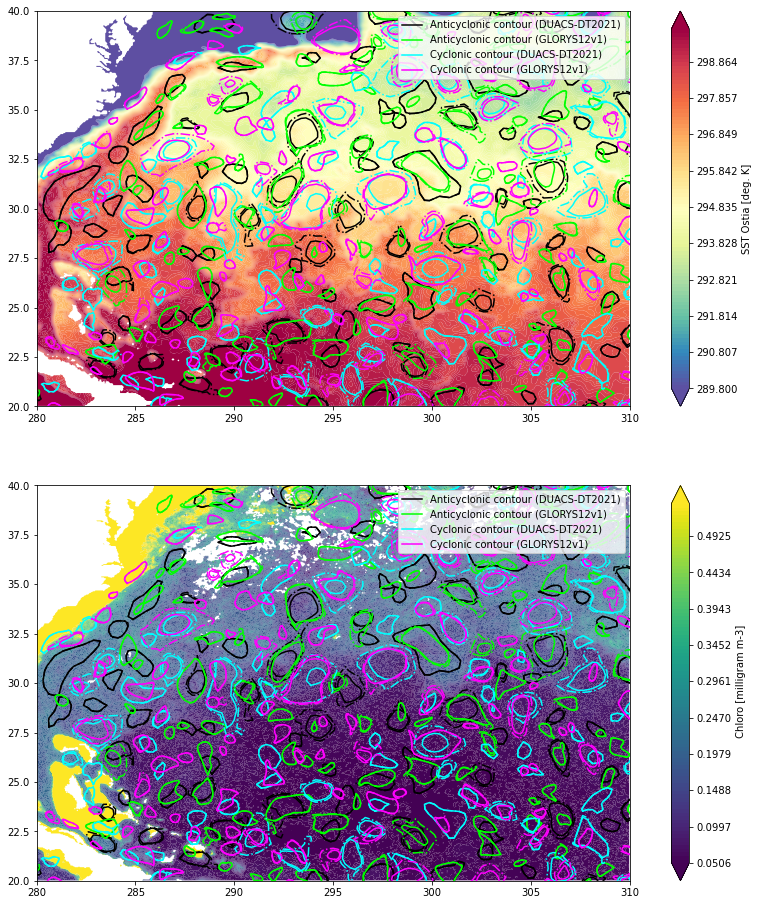

In [24]:
compare_identification(anticyclone_duacs_dt2021, cyclone_duacs_dt2021, 'DUACS-DT2021', 
                       anticyclone_glorys12, cyclone_glorys12, 'GLORYS12v1', 
                       lon_min=280, lon_max=310, lat_min=20, lat_max=40, ds_sst=ds_ostia_selection, ds_chloro=ds_chloro_selection)

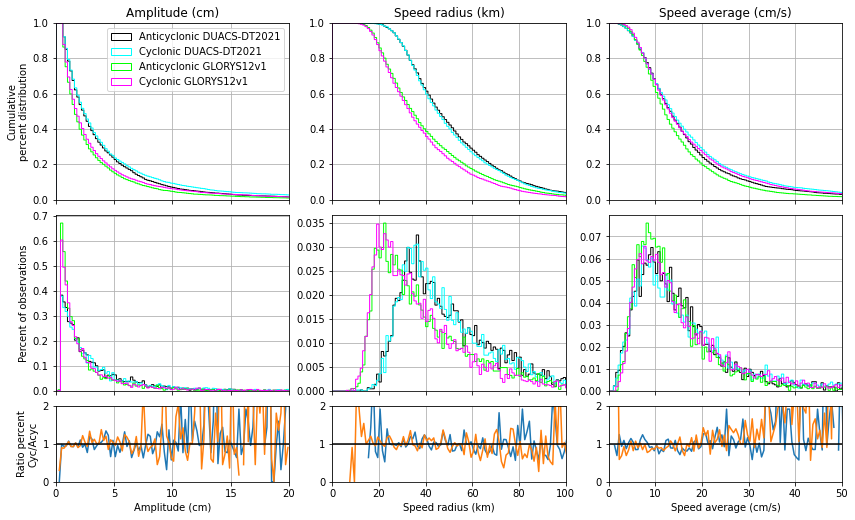

In [25]:
compare_identification_stats(anticyclone_duacs_dt2021, cyclone_duacs_dt2021, 'DUACS-DT2021', 
                       anticyclone_glorys12, cyclone_glorys12, 'GLORYS12v1')